# Analyzing, Visualizing YouTube Video Metadata Statistics

Setting up the data, cleaning, exploring, visualizations, modeling, and more...

This notebook will go through YouTube Trending Video Statistics between select countries. 

We will look at the different effects that the qualities in our data have on popularity of a video.
For the sake of this notebook, *popularity* will be defined as a video seen to have:
- trending status for a period of time
- views more than 1.5 interquartile ranges (IQRs) above third quartile
- reactions more than 1.5 interquartile ranges (IQRs) above third quartile

Where participation is a factor of the views ratio to interaction in ratings (likes/dislikes) and number of comments.

The metadata analysis will hopefully allow us to answer a few questions.

- Are trendy videos trendy forever?

Probably not. But their popularity remains!

- What will cause a video to be popular besides trending?
  - What quality make most trends?
    - Do trends come from any days in particular?
    - Do the times of the day mean anything to viewers?
    - Can the viewers themselves have a rolling effect for a video's success?
    - Can the author's words in the metadata have an effect?
      - What kind of words are most effective?

*Predict trend: **positivity in language**!*

## Imports

#### Importing Libraries

In [1]:
# Import Libraries

import glob
import json
import datetime as dt
import os
import string
import re    #for regex

import random

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline

# plotting
import matplotlib.pyplot as plt
import matplotlib.pylab as pl
import matplotlib.colors as colors
import matplotlib.gridspec as gridspec
from matplotlib import cm
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as py

# natural language processing
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from spacy.lang.en import English

import nltk
from nltk.util import bigrams
from nltk.util import trigrams
from nltk.corpus import stopwords
from nltk import pos_tag
from nltk.stem.wordnet import WordNetLemmatizer 
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.tokenize import RegexpTokenizer, TweetTokenizer

from stop_words import get_stop_words
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob

from lime.lime_text import LimeTextExplainer
from tqdm import tqdm
import operator
from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
from statistics import *
import concurrent.futures
import time
import pyLDAvis.sklearn
from pylab import bone, pcolor, colorbar, plot, show, rcParams, savefig

# keras module for building LSTM 
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Embedding, LSTM, Dense, Dropout
from keras.preprocessing.text import Tokenizer
from keras.callbacks import EarlyStopping
from keras.models import Sequential
import keras.utils as ku 

# set seeds for reproducability
import tensorflow as tf
from numpy.random import seed
tf.random.set_seed(2)
seed(1)

import warnings
warnings.filterwarnings("ignore")

ModuleNotFoundError: No module named 'plotly'

In [291]:
#Setting the stopwords to later remove all the stopwords from the text
spacey_words = list(STOP_WORDS)       
nltk_words = list(stopwords.words('english'))   
stop_words = list(get_stop_words('en'))  
stop_words.extend(nltk_words)
stop_words.extend(spacey_words)
eng_stop_words = set(stopwords.words("english"))
# Remove certain popular junk terms for clearer data
stop_words.extend(['com', 'video', 'Video', 'youtube', 'http', 'www', 'https', 'nhttp', 'nhttps', 'ntwitter', 'nfacebook', 'ninstagram', 'the'])
eng_stopwords = eng_stop_words.union(set(stop_words))

#### Print all the files being used (CSV, JSON)

In [149]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/youtube-new/USvideos.csv
/kaggle/input/youtube-new/MXvideos.csv
/kaggle/input/youtube-new/RU_category_id.json
/kaggle/input/youtube-new/JPvideos.csv
/kaggle/input/youtube-new/JP_category_id.json
/kaggle/input/youtube-new/RUvideos.csv
/kaggle/input/youtube-new/FRvideos.csv
/kaggle/input/youtube-new/DE_category_id.json
/kaggle/input/youtube-new/MX_category_id.json
/kaggle/input/youtube-new/IN_category_id.json
/kaggle/input/youtube-new/CAvideos.csv
/kaggle/input/youtube-new/GBvideos.csv
/kaggle/input/youtube-new/FR_category_id.json
/kaggle/input/youtube-new/CA_category_id.json
/kaggle/input/youtube-new/KRvideos.csv
/kaggle/input/youtube-new/DEvideos.csv
/kaggle/input/youtube-new/INvideos.csv
/kaggle/input/youtube-new/KR_category_id.json
/kaggle/input/youtube-new/US_category_id.json
/kaggle/input/youtube-new/GB_category_id.json


### Importing the data for each country from its respective file

In [150]:
csv_files = [i for i in glob.glob('/kaggle/input/youtube-new/*.{}'.format('csv'))]
sorted(csv_files)

['/kaggle/input/youtube-new/CAvideos.csv',
 '/kaggle/input/youtube-new/DEvideos.csv',
 '/kaggle/input/youtube-new/FRvideos.csv',
 '/kaggle/input/youtube-new/GBvideos.csv',
 '/kaggle/input/youtube-new/INvideos.csv',
 '/kaggle/input/youtube-new/JPvideos.csv',
 '/kaggle/input/youtube-new/KRvideos.csv',
 '/kaggle/input/youtube-new/MXvideos.csv',
 '/kaggle/input/youtube-new/RUvideos.csv',
 '/kaggle/input/youtube-new/USvideos.csv']

In [151]:
json_files = [i for i in glob.glob('/kaggle/input/youtube-new/*.{}'.format('json'))]
sorted(json_files)

['/kaggle/input/youtube-new/CA_category_id.json',
 '/kaggle/input/youtube-new/DE_category_id.json',
 '/kaggle/input/youtube-new/FR_category_id.json',
 '/kaggle/input/youtube-new/GB_category_id.json',
 '/kaggle/input/youtube-new/IN_category_id.json',
 '/kaggle/input/youtube-new/JP_category_id.json',
 '/kaggle/input/youtube-new/KR_category_id.json',
 '/kaggle/input/youtube-new/MX_category_id.json',
 '/kaggle/input/youtube-new/RU_category_id.json',
 '/kaggle/input/youtube-new/US_category_id.json']

# Preprocessing and feature engineering of the data
After combining all the above data into an appropriate dataframe, we can get a good look at what we are working with.
We can remove incomplete or missing data and add some calculated data back in.
This will give us different perspectives to work with and better be able to identify what makes a difference to a video and what doesn't.

We begin by taking in all countries into one dataframe and appending the `country` column

In [152]:
countries = []
for csv in csv_files:
    country_df = pd.read_csv(csv, index_col='video_id', encoding='ISO-8859-1')
    country_df['country'] = csv[26:28]
    countries.append(country_df)

yt_df = pd.concat(countries)
# yt_df.head(5)

Second, combining the imported JSON data by inserting the `category` column as we see here

In [153]:
yt_df['category_id'] = yt_df['category_id'].astype(str)

category_id = {}

with open('/kaggle/input/youtube-new/US_category_id.json', 'r') as f:
    data = json.load(f)
    for category in data['items']:
        category_id[category['id']] = category['snippet']['title']

yt_df.insert(4, 'category', yt_df['category_id'].map(category_id))

categories = yt_df[['category_id', 'category']].drop_duplicates().sort_values('category_id')

categories

,category_id,category
video_id,,
jr9QtXwC9vc,1,Film & Animation
5E4ZBSInqUU,10,Music
TaTleo4cOs8,15,Pets & Animals
9wRQljFNDW8,17,Sports
p2hJxyF7mok,19,Travel & Events
U0hAC8O7RoI,2,Autos & Vehicles
lsfzA7sWlOM,20,Gaming
2kyS6SvSYSE,22,People & Blogs
5qpjK5DgCt4,23,Comedy


Let's get to know the data a bit more while in its rawest state. What qualities can we expect to see?

In [154]:
print('Shape of dataframe:')
print(yt_df.shape)
print('\n\nUnique entries:\n')
print(yt_df.nunique())
print('\n\nDataframe info():\n') 
yt_df.info()

Shape of dataframe:
(375942, 17)


Unique entries:

trending_date                205
title                     186272
channel_title              37824
category_id                   18
category                      18
publish_time              169286
tags                      142211
views                     240399
likes                      73693
dislikes                   16715
comment_count              24477
thumbnail_link            185690
comments_disabled              2
ratings_disabled               2
video_error_or_removed         2
description               156165
country                       10
dtype: int64


Dataframe info():

<class 'pandas.core.frame.DataFrame'>
Index: 375942 entries, 2kyS6SvSYSE to wERgpPK44w0
Data columns (total 17 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   trending_date           375942 non-null  object
 1   title                   375942 non-null  object
 2   channel_title  

In [155]:
yt_df.head(5)

,trending_date,title,channel_title,category_id,category,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,country
video_id,,,,,,,,,,,,,,,,,
2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,People & Blogs,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,US
1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,Entertainment,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",US
5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,Comedy,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,US
puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,Entertainment,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,US
d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,Entertainment,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,US


## Dates / Times
Immediately, I can see date and time columns.

We can reformat the dates and times at this point, parsing out for clarity the following:
- Adding a feature for `publish_date`
- Time of day will simply be `publish_time`
- Also checking in with `publish_hour`
- After we have a couple of dates, we can add `time_to_trend`

    This represents the time in days between publication and beginning of trending status.
    Are instant trends more successful in terms of popularity or just hot topics?

*We will also move the complete set over for backup/later use and copy a modified dataset for working with. This will have the last stats for a given video for case of duplicate entries, as videos will sometimes trend multiple times and will be clearer to omit.*

In [156]:
yt_df['trending_date'] = pd.to_datetime(yt_df['trending_date'], errors='coerce', format='%y.%d.%m').dt.date
yt_df['publish_time'] = pd.to_datetime(yt_df['publish_time'], errors='coerce', format='%Y-%m-%dT%H:%M:%S.%fZ')

yt_df = yt_df[yt_df['trending_date'].notnull()]
yt_df = yt_df[yt_df['publish_time'].notnull()]

yt_df = yt_df.dropna(how='any', inplace=False, axis = 0)

yt_df.insert(4, 'publish_date', yt_df['publish_time'].dt.date)
yt_df['publish_hour'] = yt_df['publish_time'].dt.hour
yt_df['publish_time'] = yt_df['publish_time'].dt.time

yt_df_complete = yt_df.reset_index().sort_values('trending_date').set_index('video_id')
yt_df = yt_df.reset_index().sort_values('trending_date').drop_duplicates('video_id',keep='last').set_index('video_id')

yt_df['time_to_trend'] = (yt_df['trending_date'] - yt_df['publish_date']) / np.timedelta64(1, 'D')

yt_df[['trending_date', 'time_to_trend', 'publish_date', 'publish_time', 'publish_hour']].head()

,trending_date,time_to_trend,publish_date,publish_time,publish_hour
video_id,,,,,
5aB0Ux6sucY,2017-11-14,2.0,2017-11-12,08:51:33,8
m3NzK_u9FMI,2017-11-14,3.0,2017-11-11,02:56:57,2
_EdCoOqrj4s,2017-11-14,1.0,2017-11-13,04:44:29,4
cwcof34YxVQ,2017-11-14,3.0,2017-11-11,15:44:06,15
UWI3gbjL0k4,2017-11-14,1.0,2017-11-13,14:02:32,14


## Participation and Popularity
For further analysis, we calculate percentages and distributions based on interactions by viewers then add back into the dataframe.

- `dislike_percentage`
- `like_dislike_ratio`
- `comment_percent`
- `reaction_percent`
- `popular`

and their logs
- `likes_log`
- `views_log`
- `dislikes_log`
- `comment_log`
  
The above can help show us what's "normal" and what videos are popular and heavily participated on based on relational views, ratings, and comments.

When a video is `popular`, it is in the top percentile for `views` and `reaction_percent`.

In [212]:
# Participation percentages and ratios
yt_df['dislike_percentage'] = yt_df['dislikes'] / (yt_df['dislikes'] + yt_df['likes'])
yt_df['like_dislike_ratio'] = yt_df['likes'] / yt_df['dislikes']
yt_df['comment_percent'] = yt_df['comment_count'] / yt_df['views']
yt_df['reaction_percent'] = (yt_df['likes'] + yt_df['dislikes']) / yt_df['views']
# Participation logs
yt_df['likes_log'] = np.log(yt_df['likes'] + 1)
yt_df['views_log'] = np.log(yt_df['views'] + 1)
yt_df['dislikes_log'] = np.log(yt_df['dislikes'] + 1)
yt_df['comment_log'] = np.log(yt_df['comment_count'] + 1)
# Participation rate
yt_df['like_rate'] =  yt_df ['likes'] / yt_df['views'] * 100
yt_df['dislike_rate'] =  yt_df ['dislikes'] / yt_df['views'] * 100
yt_df['comment_rate'] =  yt_df ['comment_count'] / yt_df['views'] * 100
# Popular videos
vQ1 = yt_df.views.quantile(0.25)
vQ3 = yt_df.views.quantile(0.75)
lQ1 = yt_df.reaction_percent.quantile(0.25)
lQ3 = yt_df.reaction_percent.quantile(0.75)
vIQR = vQ3 - vQ1
lIQR = lQ3 - lQ1

# well_reacted_videos = yt_df.loc[yt_df.reaction_percent > (lQ3 + 1.5 * lIQR)]
# well_watched_videos = yt_df.loc[yt_df.views > (vQ3 + 1.5 * vIQR)]

yt_df['popular'] = 0
yt_df.loc[(yt_df.views > (vQ3 + 1.5 * vIQR)) & (yt_df.reaction_percent > (lQ1)),'popular'] = 1
popular_videos = yt_df[yt_df['popular'] == 1]
popular_videos.sort_values(by='like_dislike_ratio', ascending=False, inplace=True)
popular_videos.head(5)

,trending_date,title,channel_title,category_id,publish_date,category,publish_time,tags,views,likes,...,count_words_title,count_words_title_tags,count_stopwords,count_stopwords_tags,mean_word_len,mean_word_len_tags,word_unique_percent,word_unique_percent_tags,punct_percent,punct_percent_tags
video_id,,,,,,,,,,,,,,,,,,,,,
N1HAMUAXzbs,2018-06-14,Kris Wu â Like That (Official Music Video),Kris Wu,10,2018-05-22,Music,15:05:18,"Kris Wu|""Wu Yi Fan""|""å´äº¦å¡""|""fan shi""|""wuy...",13799079,123856,...,7,3,1,0,4.625000,13.5,100.0,100.0,25.000000,400.0
PMEkmiQP5bg,2018-05-02,G.C.F in Osaka,BANGTANTV,10,2018-04-30,Music,13:03:49,"ë°©íìë ë¨|""BTS""|""BANGTAN""|""HIPHOP""|""ë©ë...",2942269,688754,...,2,0,1,0,4.000000,39.0,100.0,100.0,66.666667,1200.0
v9ea5VDQfXg,2018-02-01,JONGHYUN ì¢ í 'ì°ë¦° ë´ì´ ì¤ê¸° ì ì (...,SMTOWN,10,2018-01-24,Music,03:00:02,"JONGHYUN|""ì¢ í""|""ì¤ì´ë""|""SHINee""|""ì°ë¦°...",2364433,364886,...,3,3,1,1,4.750000,9.5,100.0,100.0,33.333333,190.0
1YEXXIWqkMM,2017-11-17,[PREVIEW] BTS (ë°©íìë ë¨) 2018 Seasonâ...,BANGTANTV,10,2017-11-15,Music,15:00:10,"ë°©íìë ë¨|""BTS""|""BANGTAN""|""HIPHOP""|""ë©ë...",1293307,276529,...,0,0,0,0,7.125000,39.0,100.0,100.0,50.000000,1200.0
7xKwpPQiPGs,2018-02-12,[Choreography Video] SEVENTEEN(ì¸ë¸í´) - ê³...,SEVENTEEN,10,2018-02-10,Music,13:10:04,"ì¸ë¸í´|""seventeen""|""ê³ ë§ë¤""|""thanks""",810425,118942,...,2,0,0,0,9.333333,20.5,100.0,100.0,116.666667,450.0


Funnily enough, most globally popular videos are K-Pop music videos...!

### Breakdown of descriptors for type of language used
Adding some more features to the dataframe.

The author uploading the video has three different slots which may be incredibly impactful: `title`, `tags`, and `description`.
*However, descriptions may be too long for our compute power, so let's leave that out for now and focus on titles and tags.*

What effects do the authors have when choosing descriptors for the video?
- grammar
- punctuation
- complexity vs. simplicity
- implied excitement

As one might see on YouTube, videos may have run-on sentences or word noise as their only identifiers. Is this true of a trending or popular video?

In [158]:
# Helper function to count number of words in upper case
def numberOfUpper(string):
    i = 0
    for word in string.split():
        if word.isupper():
            i += 1
    return(i)

yt_df['all_upper_in_title'] = yt_df['title'].apply(numberOfUpper)

#Word count in each:
yt_df['count_word']=yt_df["title"].apply(lambda x: len(str(x).split()))
yt_df['count_word_tags']=yt_df["tags"].apply(lambda x: len(str(x).split()))

#Unique word count
yt_df['count_unique_word']=yt_df["title"].apply(lambda x: len(set(str(x).split())))
yt_df['count_unique_word_tags']=yt_df["tags"].apply(lambda x: len(set(str(x).split())))

#Letter count
yt_df['count_letters']=yt_df["title"].apply(lambda x: len(str(x)))
yt_df['count_letters_tags']=yt_df["tags"].apply(lambda x: len(str(x)))

#punctuation count
yt_df["count_punctuations"] =yt_df["title"].apply(lambda x: len([c for c in str(x) if c in string.punctuation]))
yt_df["count_punctuations_tags"] =yt_df["tags"].apply(lambda x: len([c for c in str(x) if c in string.punctuation]))

#upper case words count
yt_df["count_words_upper"] = yt_df["title"].apply(lambda x: len([w for w in str(x).split() if w.isupper()]))
yt_df["count_words_upper_tags"] = yt_df["tags"].apply(lambda x: len([w for w in str(x).split() if w.isupper()]))

#title case words count
yt_df["count_words_title"] = yt_df["title"].apply(lambda x: len([w for w in str(x).split() if w.istitle()]))
yt_df["count_words_title_tags"] = yt_df["tags"].apply(lambda x: len([w for w in str(x).split() if w.istitle()]))

#Number of stopwords
yt_df["count_stopwords"] = yt_df["title"].apply(lambda x: len([w for w in str(x).lower().split() if w in eng_stopwords]))
yt_df["count_stopwords_tags"] = yt_df["tags"].apply(lambda x: len([w for w in str(x).lower().split() if w in eng_stopwords]))

#Average length of the words
yt_df["mean_word_len"] = yt_df["title"].apply(lambda x: np.mean([len(w) for w in str(x).split()]))
yt_df["mean_word_len_tags"] = yt_df["tags"].apply(lambda x: np.mean([len(w) for w in str(x).split()]))

#Word count percent in each:
yt_df['word_unique_percent']=yt_df['count_unique_word']*100/yt_df['count_word']
yt_df['word_unique_percent_tags']=yt_df['count_unique_word_tags']*100/yt_df['count_word_tags']

#Punct percent in each:
yt_df['punct_percent']=yt_df['count_punctuations']*100/yt_df['count_word']
yt_df['punct_percent_tags']=yt_df['count_punctuations_tags']*100/yt_df['count_word_tags']

yt_df.head(3)

,trending_date,title,channel_title,category_id,publish_date,category,publish_time,tags,views,likes,...,count_words_title,count_words_title_tags,count_stopwords,count_stopwords_tags,mean_word_len,mean_word_len_tags,word_unique_percent,word_unique_percent_tags,punct_percent,punct_percent_tags
video_id,,,,,,,,,,,,,,,,,,,,,
5aB0Ux6sucY,2017-11-14,[ë³í¬ì¬ì ìì¬í­ê²©] ëíì êµ­ë¹ ìµ...,ë¯¸ëì´ìì¹ TV,24,2017-11-12,Entertainment,08:51:33,"#ëíì êµ­ë¹|""#ë³í¬ì¬""|""#ëíì êµ­ë...",70801,3136,...,0,0,0,0,10.000000,14.902439,100.00,75.609756,33.333333,236.585366
m3NzK_u9FMI,2017-11-14,ì½ë¯¸ëì¸ ì ì¢ ì² ìë´ í©ê·ë¦¼ ìì´...,NHH Daily News Stories,22,2017-11-11,People & Blogs,02:56:57,"nhhdailynewsstories|""UCZeyMmqsiIEGAAOs5tYQG4w""",205677,124,...,0,0,0,0,4.750000,46.000000,81.25,100.000000,12.500000,300.000000
_EdCoOqrj4s,2017-11-14,ë°±ë°í ë¡ ëë ì§ì´ë¤ 171113(ì) 9595...,ë¹ëì¤ì¸ìë§ì¬,25,2017-11-13,News & Politics,04:44:29,"9595ì¼|""ë°±ë°í ë¡ ""|""9595ì¼ ë°±ë°í ë¡ ""|...",28897,322,...,0,0,0,0,8.363636,9.185185,100.00,66.666667,54.545455,122.222222


# Visualizating and inferences
We will see some obvious correlations between a few fields (logs...) but expect to find interesting tidbits to delve further into.

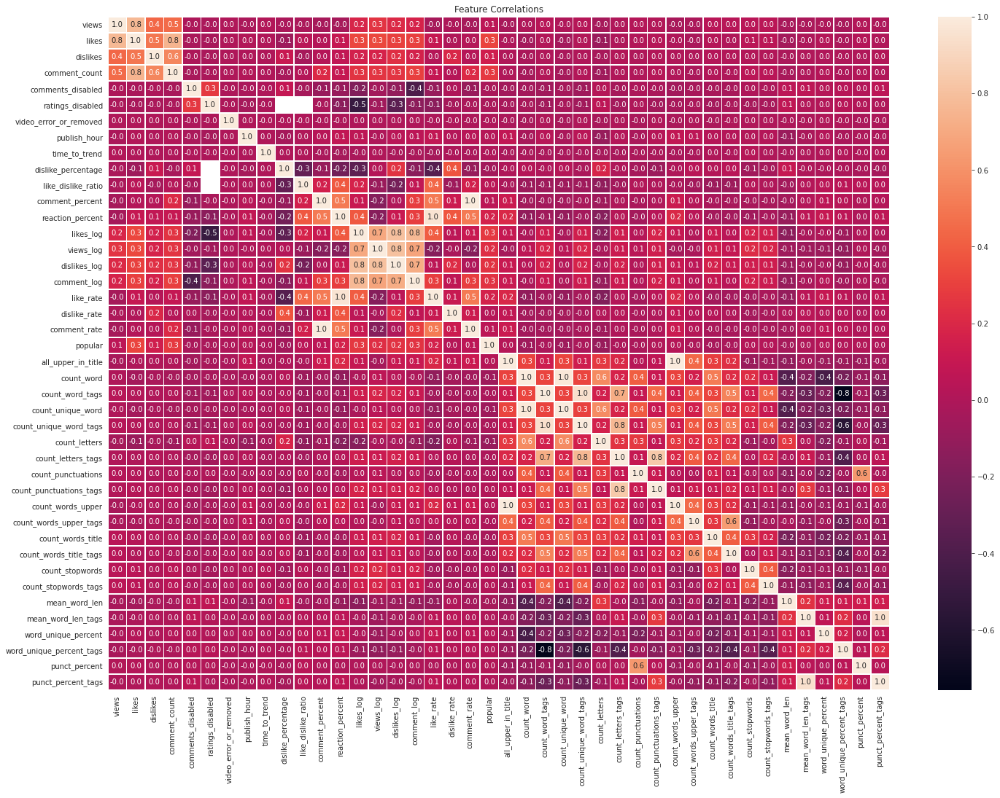

In [159]:
f,ax = plt.subplots(figsize=(24, 17))
sns.heatmap(yt_df.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)
plt.title('Feature Correlations')
plt.show()

#### Times

In [160]:
max_title_length = 20
number_of_videos = 20

viewers = yt_df.sort_values(["views"], ascending=False).head(number_of_videos)
viewers_title = [(x if len(x) <= max_title_length else x[:max_title_length] + "...") for x in viewers.title.values]
viewers_publish_hour = viewers.publish_hour.values
viewers_views = viewers.views.values

trace1 = go.Bar(
    x = viewers_title,
    y = viewers_publish_hour,
    name='Hour of Publishing',
    marker=dict(
        color='rgba(55, 128, 191, 0.7)',
        line=dict(
            color='rgba(55, 128, 191, 1.0)',
            width=2,
        )
    )
)
trace2 = go.Bar(
    x = viewers_title,
    y = viewers_views,
    name='Total Views',
    marker=dict(
        color='rgba(219, 64, 82, 0.7)',
        line=dict(
            color='rgba(219, 64, 82, 1.0)',
            width=2,
        )
    ),
    yaxis='y2'
)


data = [trace1, trace2]
layout = go.Layout(
    barmode='group',
    title = 'Views',
    width=900,
    height=500,
    margin=go.Margin(
        l=75,
        r=75,
        b=120,
        t=80,
        pad=10
    ),
    paper_bgcolor='rgb(244, 238, 225)',
    plot_bgcolor='rgb(244, 238, 225)',
    yaxis = dict(
        title= 'Hour of Publishing',
        anchor = 'x',
        rangemode='tozero'
    ),   
    yaxis2=dict(
        title='Total Number of Views',
        titlefont=dict(
            color='rgb(148, 103, 189)'
        ),
        tickfont=dict(
            color='rgb(148, 103, 189)'
        ),
        overlaying='y',
        side='right',
        anchor = 'x',
        rangemode = 'tozero',
        dtick = 61000
    ),
    #legend=dict(x=-.1, y=1.2)
    legend=dict(x=0.1, y=0.05)
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

For the *most viewed* videos, the hour of publishing and total views have no apparent relation.

In [161]:
max_title_length = 20
number_of_late_bloomers = 20

late_bloomers = yt_df.sort_values(["time_to_trend"], ascending=False).head(number_of_late_bloomers)
late_bloomers_title = [(x if len(x) <= max_title_length else x[:max_title_length] + "...") for x in late_bloomers.title.values]
late_bloomers_days = late_bloomers.time_to_trend.values
late_bloomers_views = late_bloomers.views.values

trace1 = go.Bar(
    x = late_bloomers_title,
    y = late_bloomers_days,
    name='Number of days',
    marker=dict(
        color='rgba(55, 128, 191, 0.7)',
        line=dict(
            color='rgba(55, 128, 191, 1.0)',
            width=2,
        )
    )
)
trace2 = go.Bar(
    x = late_bloomers_title,
    y = late_bloomers_views,
    name='total views',
    marker=dict(
        color='rgba(219, 64, 82, 0.7)',
        line=dict(
            color='rgba(219, 64, 82, 1.0)',
            width=2,
        )
    ),
    yaxis='y2'
)


data = [trace1, trace2]
layout = go.Layout(
    barmode='group',
    title = 'Late bloomers',
    width=900,
    height=500,
    margin=go.Margin(
        l=75,
        r=75,
        b=120,
        t=80,
        pad=10
    ),
    paper_bgcolor='rgb(244, 238, 225)',
    plot_bgcolor='rgb(244, 238, 225)',
    yaxis = dict(
        title= 'Number of days until becoming trending',
        anchor = 'x',
        rangemode='tozero'
    ),   
    yaxis2=dict(
        title='Total number of views',
        titlefont=dict(
            color='rgb(148, 103, 189)'
        ),
        tickfont=dict(
            color='rgb(148, 103, 189)'
        ),
        overlaying='y',
        side='right',
        anchor = 'x',
        rangemode = 'tozero',
        dtick = 61000
    ),
    #legend=dict(x=-.1, y=1.2)
    legend=dict(x=0.1, y=0.05)
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

Time published doesn't make as much of a difference as expected.
   * Easily, evenings are the most common for publishing but a video can still get a good trend going much later. 
   * Instant successes aren't the only videos being viewed! Publish whenever is convenient for you, YouTubers.
     * a video may start to trend long after publishing

#### Participation rates

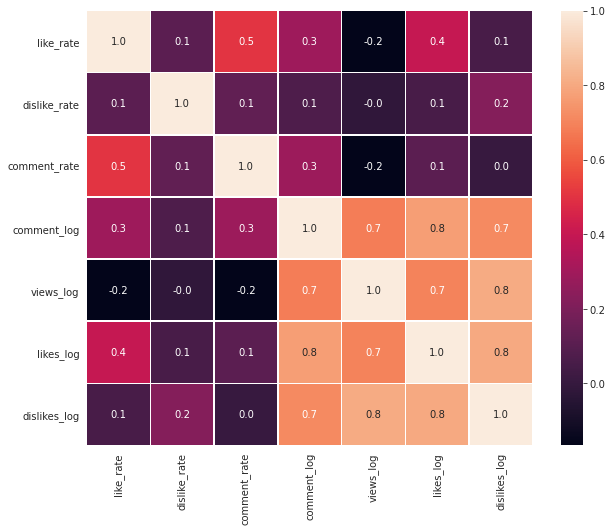

In [162]:
plt.figure(figsize = (10,8))

sns.heatmap(yt_df[['like_rate', 'dislike_rate', 'comment_rate', 'comment_log',
         'views_log','likes_log','dislikes_log', 'category']].corr(), annot=True, linewidths=.5, fmt= '.1f')
plt.show()

We can notice a few things from looking here:
1. Participation for the video is the highest effective way to get more views.
2. If there is promise of excitement (wordy titles or all upper case in titles), there is a slight uptick in participation with likes and comments.
3. Videos with lots of descriptors (in tags and titles) using complicated/lengthy terms, or repetition of simple words with no punctuation leads to a small **downturn** for views, likes, dislikes, and comments where normally more words are trending helpful.

There are many fun and subtle effects that can be observed, but by far the biggest relationships are in the words themselves! Seeing as how that may be easier to directly affect as the uploader, maybe a YouTuber can derive value from this.

### Closer looks
Punctuation can be an indicator of a message being properly conveyed through use of proper or improper grammar. What reactions do these cleverly titled/tagged videos get?

If we can grab context well from what the author is telling us, perhaps we have a more favorable view to the non-surprises we click on.

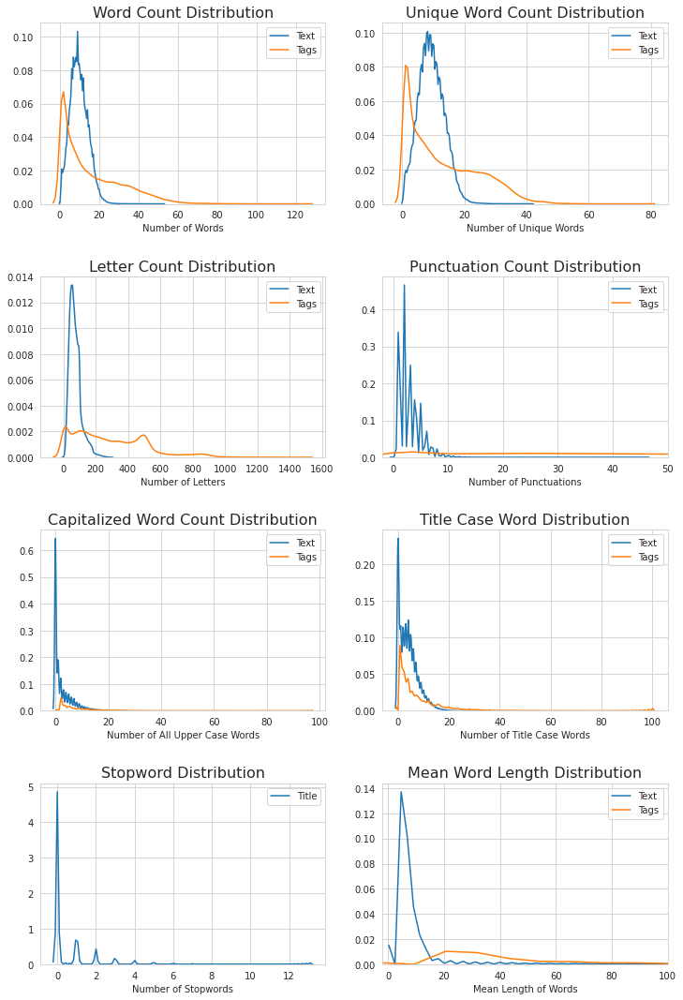

In [163]:
plt.figure(figsize = (12,18))

plt.subplot(421)
g1 = sns.distplot(yt_df['count_word'], 
                  hist=False, label='Text')
g1 = sns.distplot(yt_df['count_word_tags'], 
                  hist=False, label='Tags')
g1.set_xlabel("Number of Words")
g1.set_title('Word Count Distribution', fontsize=16)

plt.subplot(422)
g2 = sns.distplot(yt_df['count_unique_word'],
                  hist=False, label='Text')
g2 = sns.distplot(yt_df['count_unique_word_tags'], 
                  hist=False, label='Tags')
g2.set_xlabel("Number of Unique Words")
g2.set_title('Unique Word Count Distribution', fontsize=16)

plt.subplot(423)
g3 = sns.distplot(yt_df['count_letters'], 
                  hist=False, label='Text')
g3 = sns.distplot(yt_df['count_letters_tags'], 
                  hist=False, label='Tags')
g3.set_xlabel("Number of Letters")
g3.set_title('Letter Count Distribution', fontsize=16)

plt.subplot(424)
g4 = sns.distplot(yt_df['count_punctuations'], 
                  hist=False, label='Text')
g4 = sns.distplot(yt_df['count_punctuations_tags'], 
                  hist=False, label='Tags')
g4.set_xlabel("Number of Punctuations")
g4.set_xlim([-2,50])
g4.set_title('Punctuation Count Distribution', fontsize=16)

plt.subplot(425)
g5 = sns.distplot(yt_df['count_words_upper'] , 
                  hist=False, label='Text')
g5 = sns.distplot(yt_df['count_words_upper_tags'] , 
                  hist=False, label='Tags')
g5.set_xlabel("Number of All Upper Case Words")
g5.set_title('Capitalized Word Count Distribution', fontsize=16)

plt.subplot(426)
g6 = sns.distplot(yt_df['count_words_title'], 
                  hist=False, label='Text')
g6 = sns.distplot(yt_df['count_words_title_tags'], 
                  hist=False, label='Tags')
g6.set_xlabel("Number of Title Case Words")
g6.set_title('Title Case Word Distribution', fontsize=16)

plt.subplot(427)
g7 = sns.distplot(yt_df['count_stopwords'], 
                  hist=False, label='Title')
# g7 = sns.distplot(yt_df['count_stopwords_tags'], 
#                   hist=False, label='Tags')
g7.set_xlabel("Number of Stopwords")
g7.set_title('Stopword Distribution', fontsize=16)

plt.subplot(428)
g8 = sns.distplot(yt_df['mean_word_len'], 
                  hist=False, label='Text')
g8 = sns.distplot(yt_df['mean_word_len_tags'], 
                  hist=False, label='Tags')
g8.set_xlabel("Mean Length of Words")
g8.set_xlim([-2,100])
g8.set_title('Mean Word Length Distribution', fontsize=16)

plt.subplots_adjust(wspace = 0.2, hspace = 0.4,top = 0.9)
plt.legend()
plt.show()

Should one use 46 marks of punctuation!? Maybe, but it seems 45 has a pretty good standing.

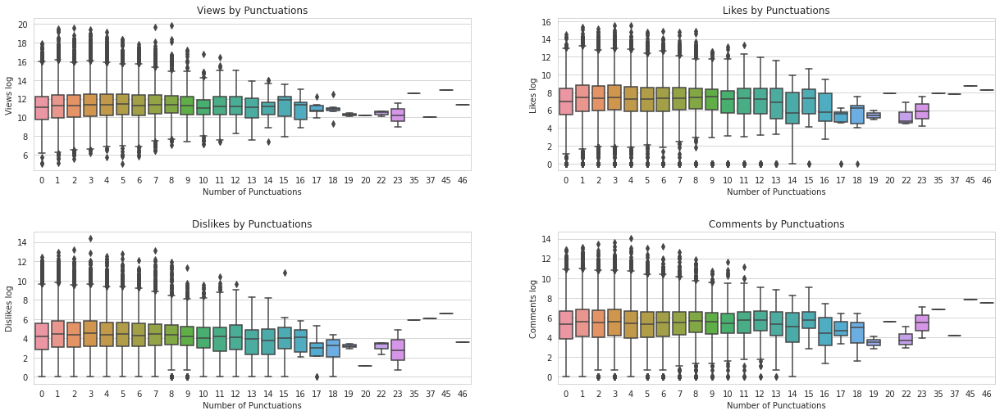

In [164]:
plt.figure(figsize = (21,8))

plt.subplot(221)
g=sns.boxplot(x='count_punctuations', y='views_log',data=yt_df)
g.set_title("Views by Punctuations")
g.set_xlabel("Number of Punctuations")
g.set_ylabel("Views log")

plt.subplot(222)
g1 = sns.boxplot(x='count_punctuations', y='likes_log',data=yt_df)
g1.set_title("Likes by Punctuations")
g1.set_xlabel("Number of Punctuations")
g1.set_ylabel("Likes log")

plt.subplot(223)
g2 = sns.boxplot(x='count_punctuations', y='dislikes_log',data=yt_df)
g2.set_title("Dislikes by Punctuations")
g2.set_xlabel("Number of Punctuations")
g2.set_ylabel("Dislikes log")

plt.subplot(224)
g3 = sns.boxplot(x='count_punctuations', y='comment_log',data=yt_df)
g3.set_title("Comments by Punctuations")
g3.set_xlabel("Number of Punctuations")
g3.set_ylabel("Comments log")

plt.subplots_adjust(wspace = 0.2, hspace = 0.4,top = 0.9)

plt.show()

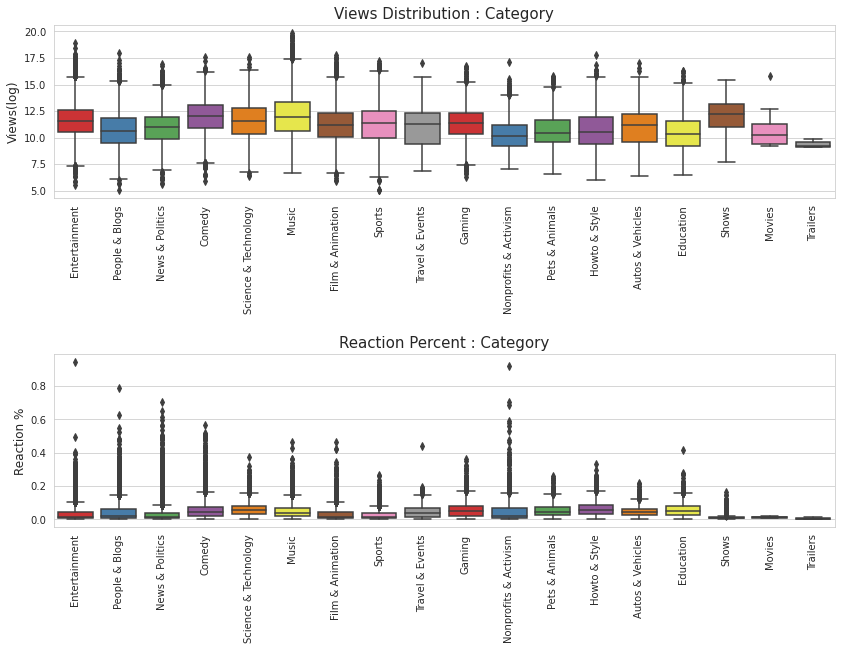

In [165]:
plt.figure(figsize = (14,9))

plt.subplot(211)
cat_box = sns.boxplot(x='category', y='views_log', data=yt_df, palette="Set1")
cat_box.set_xticklabels(cat_box.get_xticklabels(),rotation=90)
cat_box.set_title("Views Distribution : Category", fontsize=15)
cat_box.set_xlabel("", fontsize=12)
cat_box.set_ylabel("Views(log)", fontsize=12)

plt.subplot(212)
count_box = sns.boxplot('category', 'reaction_percent', data=yt_df, palette="Set1")
count_box.set_xticklabels(count_box.get_xticklabels(),rotation=90)
count_box.set_title("Reaction Percent : Category", fontsize=15)
count_box.set_xlabel("", fontsize=12)
count_box.set_ylabel("Reaction %", fontsize=12)

plt.subplots_adjust(hspace = 0.9, top = 0.9)

plt.show()

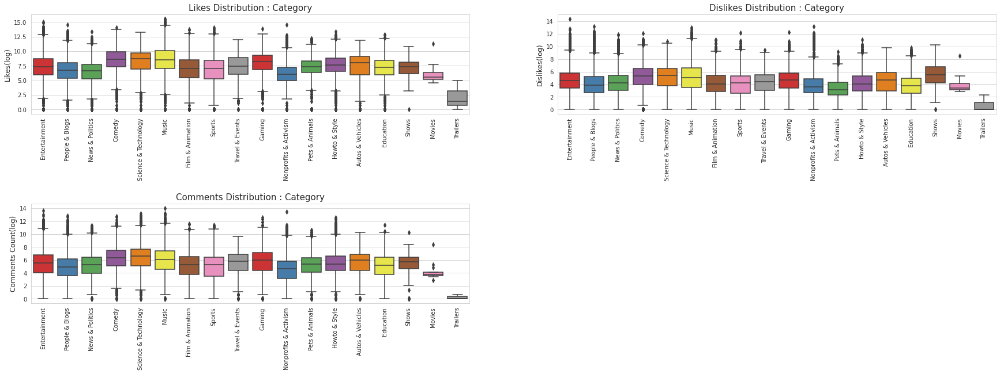

In [166]:
plt.figure(figsize = (30,9))

plt.subplot(221)
likes_cat = sns.boxplot(x='category', y='likes_log', data=yt_df, palette="Set1")
likes_cat.set_xticklabels(likes_cat.get_xticklabels(),rotation=90)
likes_cat.set_title("Likes Distribution : Category", fontsize=15)
likes_cat.set_xlabel("", fontsize=12)
likes_cat.set_ylabel("Likes(log)", fontsize=12)

plt.subplot(222)
dislikes_cat = sns.boxplot(x='category', y='dislikes_log', data=yt_df, palette="Set1")
dislikes_cat.set_xticklabels(dislikes_cat.get_xticklabels(),rotation=90)
dislikes_cat.set_title("Dislikes Distribution : Category", fontsize=15)
dislikes_cat.set_xlabel("", fontsize=12)
dislikes_cat.set_ylabel("Dislikes(log)", fontsize=12)

plt.subplot(223)
comment_cat = sns.boxplot(x='category', y='comment_log', data=yt_df, palette="Set1")
comment_cat.set_xticklabels(comment_cat.get_xticklabels(),rotation=90)
comment_cat.set_title("Comments Distribution : Category", fontsize=15)
comment_cat.set_xlabel("", fontsize=12)
comment_cat.set_ylabel("Comments Count(log)", fontsize=12)

plt.subplots_adjust(hspace = 0.9, top = 0.9)
plt.show()

As viewers of the YouTubes, we love to be entertained... **except by trailers**.

Entertainers and activists have far reaching outliers; maybe expected? They *can* have very niche crowds.

Comedy and politics categories hold the steadiest expectations in getting a reaction.

- What are the polarities in play here? 
- What do the people feel?

#### Correlation of views with descriptors (titles / tags)

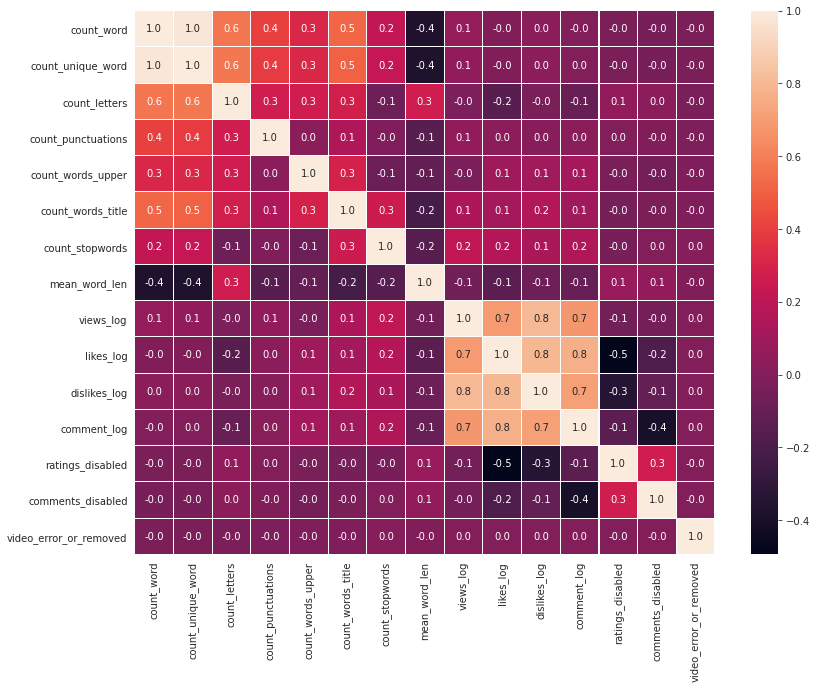

In [167]:
plt.figure(figsize = (13,10))

sns.heatmap(yt_df[['count_word', 'count_unique_word','count_letters',
                     "count_punctuations","count_words_upper", "count_words_title", 
                     "count_stopwords","mean_word_len", 
                     'views_log', 'likes_log','dislikes_log','comment_log',
                     'ratings_disabled', 'comments_disabled', 'video_error_or_removed']].corr(), linewidths=0.1, fmt= '.1f', annot=True)
plt.show()

Viewers tend to view and react to videos with well-formatted titles and tags **inclusionary** of stopwords, punctuation, and capitalization.

Ratings and comments disabled videos or videos that have an error or are removed tend to have less interaction (as intended, of course) but also seemingly have slightly above average word length. Maybe the words are transfer data or spam?

# What type of descriptive words *are reasonably popular*? (English only [US/GB/CA])
Now we count the frequency of descriptor words and take a look at what people are seeing when they check out YouTube's trending.

*Not everything is a 'dank meme' is it?*

In [276]:
top_N = 100

# Get US/GB title and tags
yt_df.sort_values(by='views', ascending=False, inplace=True)
en_df = yt_df.loc[yt_df['country'].isin(['US', 'GB', 'CA'])]
desc_df = en_df.loc[:, en_df.columns.isin(['title', 'tags', 'description'])]
# Strip words from three features
raw_title_words = desc_df['title'].str.lower().str.cat(sep=' ')
raw_tags_words = desc_df['tags'].str.lower().str.cat(sep=' ')
raw_desc_words = desc_df['description'].str.lower().str.cat(sep=' ')


# wordcloud
def wc(data, bgcolor, title):
#     plt.figure(figsize = (15,15))
    wc = WordCloud(background_color = bgcolor, max_words = 1000,  max_font_size = 50)
    wc.generate(' '.join(data))
    plt.imshow(wc)
    plt.axis('off')

def popular_word_display(raw_words, pos, desc_type):
    # Removes punctuation,numbers and returns list of words
    desc_words = re.sub('[^A-Za-z]+', ' ', raw_words)

    word_tokens = word_tokenize(desc_words)
    filtered_sentence = [w for w in word_tokens if not w in eng_stopwords]
    filtered_sentence = []
    for w in word_tokens:
        if w not in eng_stopwords:
            filtered_sentence.append(w)

    # Remove characters which have length less than 2  
    without_single_chr = [word for word in filtered_sentence if len(word) > 2]

    # Remove numbers
    cleaned_data = [word for word in without_single_chr if not word.isnumeric()]        

    # Calculate frequency distribution
    word_dist = nltk.FreqDist(cleaned_data)
    rslt = pd.DataFrame(word_dist.most_common(top_N),
                        columns=[desc_type, 'Frequency'])

    sns.set_style("whitegrid")
    ax = fig.add_subplot(gs[0, pos]) # row 0, col 0
    sns.barplot(x=desc_type,y="Frequency", data=rslt.head(7), ax=ax)
    ax1 = fig.add_subplot(gs[1,pos])
    wc(cleaned_data, 'black', 'Most Common Description Words' )
    

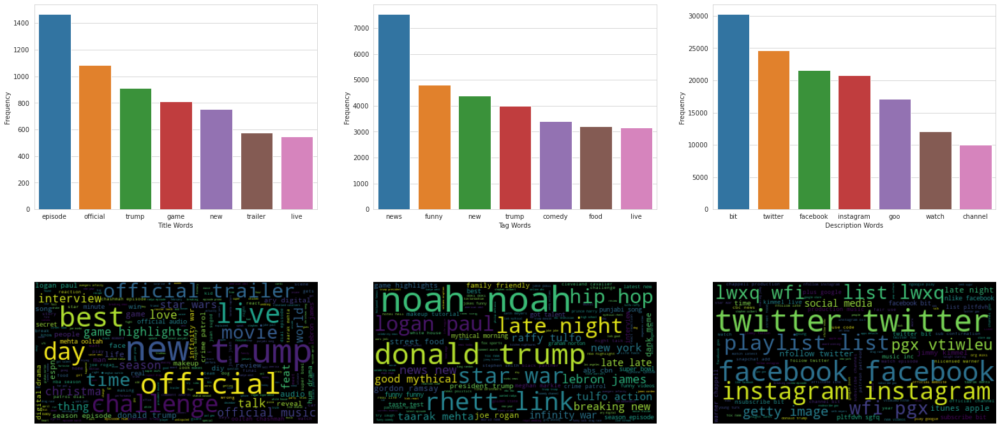

In [169]:
# Create 3x2 sub plots
fig = plt.figure(figsize=(27, 13), constrained_layout=False)
gs = fig.add_gridspec(ncols=3, nrows=2)

# Graph with wordcloud underneath
popular_word_display(raw_title_words, 0, 'Title Words')
popular_word_display(raw_tags_words, 1, 'Tag Words')
popular_word_display(raw_desc_words, 2, 'Description Words')

## Descriptor Words
The most generic and unimaginative words are the most popular for video descriptors! Or is simplicity the most common denominator?

So we took out obvious words like 'video' and 'youtube' to see clearer what is being used here.

* Titles trend towards status-sounding words, like 'official'/'new'/'live', likely grabbing attention.
* Tags seem to be the best for wide content searching and are topical. 
  * Likely to be more telling of what's current for the time
  * Might be arbitrarily added; by the sheer quantity, unreliable
* Descriptions contain lots of links to/from external applications (bit.ly, twitter, instagram,..) and command words (follow, watch, stream,..) [which are probably links, too].

Likely what we are seeing here is the addition of lots of descriptor language in order to get picked up by search algorithms (and some probable creator rambling). In addition, there are abundances of interactive links being given in what could be extra chances to redirect attention to another video or idea; an author's attempt to trend as a content creator! 

Let's redirect our attention to the titles then, as they seem to be more *reliable* as indicators of what is in the video and what viewers may associate with the video.

## Positive or Negative Title?

In [170]:
bloblist_title = list()

for row in desc_df['title']:
    blob = TextBlob(row)
    bloblist_title.append((row,blob.sentiment.polarity, blob.sentiment.subjectivity))
    df_polarity_title = pd.DataFrame(bloblist_title, columns = ['sentence','sentiment','polarity'])

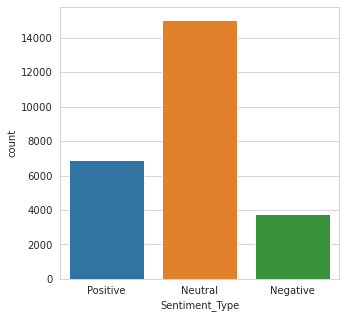

In [171]:
def f_title(df_polarity_title):
    if df_polarity_title['sentiment'] > 0:
        val = "Positive"
    elif df_polarity_title['sentiment'] == 0:
        val = "Neutral"
    else:
        val = "Negative"
    return val



df_polarity_title['Sentiment_Type'] = df_polarity_title.apply(f_title, axis=1)

plt.figure(figsize=(5,5))
sns.set_style("whitegrid")
ax = sns.countplot(x="Sentiment_Type", data=df_polarity_title)

Neutral words are the most popular descriptors for content creators to use in their titles. Certainly, this is due to fragment context.
Most descriptive words in titles are to be considered auxiliary and probable neutral.

On the other hand, titles may grab someone looking for a bit of relief of their regularly neutral lives. Polarizing feelings can be relieving, if not exciting and in the form of the **positive** more than double the time.


### A positively exciting play on words

What words most common for positive sentiment?

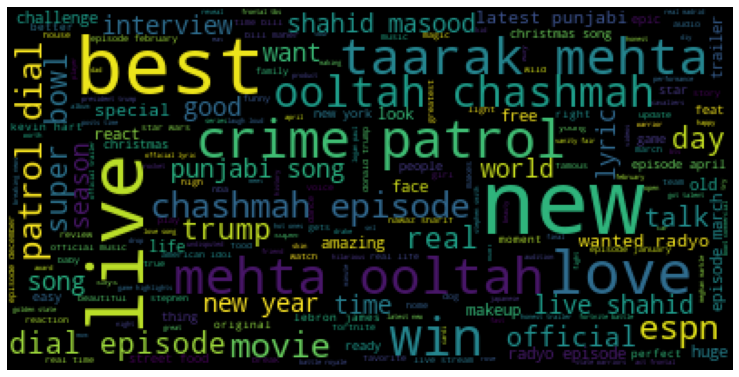

In [172]:

pos_titles = df_polarity_title['sentence'][df_polarity_title['Sentiment_Type'] == 'Positive']
pos_title_words = pos_titles.str.lower().str.cat(sep=' ')

plt.figure(figsize=(13,9))
popular_word_display(pos_title_words, 0, 'Most Positive Title Video Words')

At the time of running one can immediately notice:
* live
* win
* love
* new
* best
* good
* real
* special
* perfect
* right

In [173]:
pos_title_words_list = ['live', 'win', 'love', 'new', 'best', 'good', 'real', 'special', 'perfect', 'right']

In [174]:
d_pos = en_df[en_df['title'].isin(pos_titles)].groupby('category').median().sort_values('views', ascending=False)
d_neg = en_df[~en_df['title'].isin(pos_titles)].groupby('category').median().sort_values('views', ascending=False)

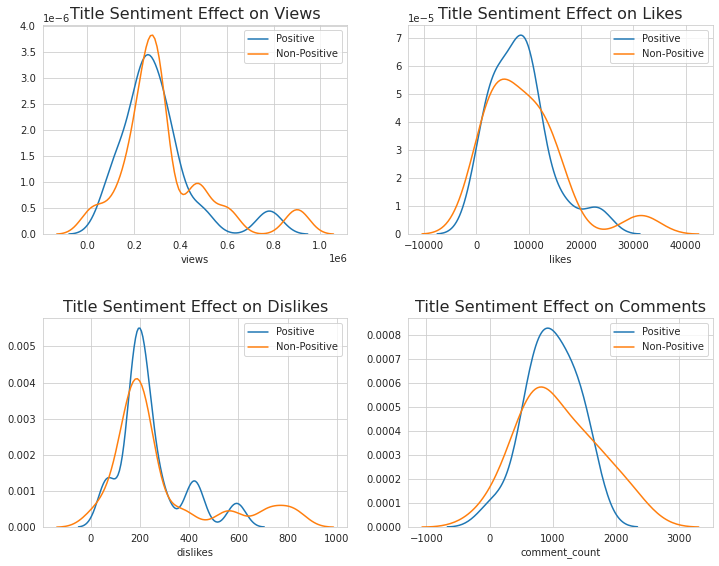

In [175]:
plt.figure(figsize = (12,9))

plt.subplot(221)
g1 = sns.distplot(d_pos['views'],
                  hist=False, label='Positive')
g1 = sns.distplot(d_neg['views'],
                  hist=False, label='Non-Positive')
g1.set_title("Title Sentiment Effect on Views", fontsize=16)

plt.subplot(222)
g2 = sns.distplot(d_pos['likes'], 
                  hist=False, label='Positive')
g2 = sns.distplot(d_neg['likes'], 
                  hist=False, label='Non-Positive')
g2.set_title("Title Sentiment Effect on Likes", fontsize=16)

plt.subplot(223)
g3 = sns.distplot(d_pos['dislikes'], 
                  hist=False, label='Positive')
g3 = sns.distplot(d_neg['dislikes'], 
                  hist=False, label='Non-Positive')
g3.set_title("Title Sentiment Effect on Dislikes", fontsize=16)

plt.subplot(224)
g4 = sns.distplot(d_pos['comment_count'], 
                  hist=False, label='Positive')
g4 = sns.distplot(d_neg['comment_count'], 
                  hist=False, label='Non-Positive')
g4.set_title("Title Sentiment Effect on Comments", fontsize=16)

plt.subplots_adjust(wspace = 0.2, hspace = 0.4,top = 0.9)
plt.legend()
plt.show()

As we can see here, there is a definite contrast between the **POSITIVE** titled videos and non-positively (NEUTRAL and NEGATIVE) titled.

We might view anything but that can include quickly switching to the next video, sometimes we hate-watch... but participation must be worth our time!

Perhaps we can conclude that YouTube viewers will always trend towards what is *known* (because of clear descriptions) and *associated positive*. 

### People are optimistic, after all!

# YES: Positively Popular!
If we take the most popular videos, we can compare.

What can we predict?


In [292]:
punctuations = string.punctuation
parser = English()

def spacy_tokenizer(sentence):
    # Removes punctuation,numbers and returns list of words
    desc_words = re.sub('[^A-Za-z]+', ' ', sentence)
    mytokens = parser(desc_words)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    mytokens = [ word for word in mytokens if word not in eng_stopwords and word not in punctuations ]
    mytokens = " ".join([i for i in mytokens])
    return mytokens


tqdm.pandas()

normal = en_df["title"][en_df["popular"] == 0].progress_apply(spacy_tokenizer)
popular = en_df["title"][en_df["popular"] == 1].progress_apply(spacy_tokenizer)

100%|██████████| 6543/6543 [00:01<00:00, 6355.81it/s]


In [293]:
#tokenize words by popularity 

def word_generator(text):
    word = list(text.split())
    return word
# def bigram_generator(text):
#     bgram = list(bigrams(text.split()))
#     bgram = [' '.join((a, b)) for (a, b) in bgram]
#     return bgram
# def trigram_generator(text):
#     tgram = list(trigrams(text.split()))
#     tgram = [' '.join((a, b, c)) for (a, b, c) in tgram]
#     return tgram


normal_words = normal.progress_apply(word_generator)
popular_words = popular.progress_apply(word_generator)
# normal_bigrams = normal.progress_apply(bigram_generator)
# popular_bigrams = popular.progress_apply(bigram_generator)
# normal_trigrams = normal.progress_apply(trigram_generator)
# popular_trigrams = popular.progress_apply(trigram_generator)

100%|██████████| 6543/6543 [00:00<00:00, 207993.84it/s]


In [294]:
word_vectorizer = TfidfVectorizer(
    sublinear_tf=True,
    strip_accents='unicode',
    analyzer='word',
    token_pattern=r'\w{1,}',
    stop_words='english',
    ngram_range=(1, 1),
    max_features=10000)
word_vectorizer.fit(en_df.title)
word_features = word_vectorizer.transform(en_df.title)

classifier_popular = LogisticRegression(C=0.1, solver='sag')
classifier_popular.fit(word_features ,en_df.popular)

LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='sag', tol=0.0001, verbose=0,
                   warm_start=False)

In [265]:
names=['normal','popular']

In [295]:
c_tf = make_pipeline(word_vectorizer, classifier_popular)
explainer_tf = LimeTextExplainer(class_names=names)

exp = explainer_tf.explain_instance(en_df.title.iloc[2], c_tf.predict_proba, num_features=4, top_labels=1)
exp.show_in_notebook(text=en_df.title.iloc[2])

In [296]:
exp = explainer_tf.explain_instance(en_df.title.iloc[9], c_tf.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(text=en_df.title.iloc[9])

In [300]:
exp = explainer_tf.explain_instance(en_df.title.iloc[1100], c_tf.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(text=en_df.title.iloc[1100])

In [298]:
exp = explainer_tf.explain_instance(en_df.title.iloc[18187], c_tf.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(text=en_df.title.iloc[18187])

In [301]:
tokenizer = Tokenizer()

def get_sequence_of_tokens(corpus):
    ## tokenization
    tokenizer.fit_on_texts(corpus)
    total_words = len(tokenizer.word_index) + 1
    
    ## convert data to sequence of tokens 
    input_sequences = []
    for line in corpus:
        token_list = tokenizer.texts_to_sequences([line])[0]
        for i in range(1, len(token_list)):
            n_gram_sequence = token_list[:i+1]
            input_sequences.append(n_gram_sequence)
    return input_sequences, total_words

inp_sequences, total_words = get_sequence_of_tokens(normal)
inp_sequences[:10]

[[4327, 2056],
 [4327, 2056, 23],
 [4327, 2056, 23, 259],
 [4327, 2056, 23, 259, 9470],
 [4327, 2056, 23, 259, 9470, 23],
 [4327, 2056, 23, 259, 9470, 23, 9471],
 [4327, 2056, 23, 259, 9470, 23, 9471, 3664],
 [4327, 2056, 23, 259, 9470, 23, 9471, 3664, 1125],
 [4327, 2056, 23, 259, 9470, 23, 9471, 3664, 1125, 6644],
 [4327, 2056, 23, 259, 9470, 23, 9471, 3664, 1125, 6644, 2272]]

In [308]:
def generate_padded_sequences(input_sequences):
    max_sequence_len = max([len(x) for x in input_sequences])
    input_sequences = np.array(pad_sequences(input_sequences, maxlen=max_sequence_len, padding='pre'))
    
    predictors, label = input_sequences[:,:-1],input_sequences[:,-1]
    label = ku.to_categorical(label, num_classes=total_words)
    return predictors, label, max_sequence_len

predictors, label, max_sequence_len = generate_padded_sequences(inp_sequences)

In [303]:
def create_model(max_sequence_len, total_words):
    input_len = max_sequence_len - 1
    model = Sequential()
    
    # Add Input Embedding Layer
    model.add(Embedding(total_words, 10, input_length=input_len))
    
    # Add Hidden Layer 1 - LSTM Layer
    model.add(LSTM(100))
    model.add(Dropout(0.1))
    
    # Add Output Layer
    model.add(Dense(total_words, activation='softmax'))

    model.compile(loss='categorical_crossentropy', optimizer='adam')
    
    return model

model = create_model(max_sequence_len, total_words)
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, 26, 10)            189270    
_________________________________________________________________
lstm_5 (LSTM)                (None, 100)               44400     
_________________________________________________________________
dropout_5 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 18927)             1911627   
Total params: 2,145,297
Trainable params: 2,145,297
Non-trainable params: 0
_________________________________________________________________


In [304]:
# model.fit(predictors, label, epochs=5, verbose=5)
model.fit(predictors, label, epochs=50, verbose=5)

Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


In [315]:
def generate_text(seed_text, next_words):
    for _ in range(next_words):
        token_list = tokenizer.texts_to_sequences([seed_text])[0]
        token_list = pad_sequences([token_list], maxlen=max_sequence_len-1, padding='pre')
        predicted = model.predict_classes(token_list, verbose=0)
        
        output_word = ""
        for word,index in tokenizer.word_index.items():
            if index == predicted:
                output_word = word
                break
        seed_text += " "+output_word
    return seed_text.title()

In [319]:
def generate_title_texts(words_list):
    for word in words_list:
        print(generate_text(word, random.randint(4, 10)))

In [322]:
generate_title_texts(pos_title_words_list)

Live Dr Shahid Masood December Nawaz Sharif Asif Zardari
Win Vs Sweden Gold Medal Final Minutes Game Win Vs Suns
Love Beautiful Tour Ft Nikki Limo
New Year Resolutions Makeup Routine Tutorial L Edition Episode Mtv
Best Worst Dressed Billboard Music Kills Today Laundry Fortnite Songs King
Good Live Ep Walking Disney Day Ep Report
Real Time Bill Maher March Mitch Landrieu Gina Mccarthy Mona
Special N Mu N U U H
Perfect Circle Talktalk Game Grumps Animated
Right Dishonest Best World Prime


In [331]:
exp = explainer_tf.explain_instance('Best Worst Dressed Billboard Music Kills Today Laundry Fortnite Songs King', c_tf.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(text='Best Worst Dressed Billboard Music Kills Today Laundry Fortnite Songs King')

If we used our positive words from earlier, we can generate video titles (of different random lengths) that would likely be **popular** at YouTube!